# Programa con Modelo que evalua los rangos de la masa estelar y agrega el error del tiempo adaptativo (h)

## Cargamos los paquetes

In [ ]:
import numpy as np
import pandas as pd
import math as m
import seaborn as sn
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import warnings
warnings.filterwarnings('ignore')

## Se definen las unidades canónicas o naturales que se usarán

In [ ]:
#Definimos las constantes
kpc_to_km = 3.0857e16 #km
M_sun = 1.9885e30 #1.9891e30 #kg
km_to_m = 1e3 #m
yr_to_s = 3.1536e7 #s
Gyr_s = yr_to_s*1e9 #s

# Unidades canónicas
ul= 1.0 #kpc
um= (1.0e0) # M_Sun
uv = 1 #km/s
ut = ul*kpc_to_km/(uv*Gyr_s) #Gyr
ut_y1 = (ut/yr_to_s) #Myr
ut_y = (ut/yr_to_s)/1e6

#Deduccion unidades G
G_ini = 6.674e-11 #m^3/(kg.s^2)

Gkm = G_ini / (km_to_m)**3  #km³ / (kg * s²)
G1 = (Gkm /kpc_to_km) * M_sun    # (kpc/M_sun) (km/s)²

G2 = (G1/ul*uv)*um #Este es el valor de G que usamos en el script

G2 = (G1/ul*uv)*um #Este es el valor de G que usamos en el script
print('G en unidades canónicas es',format(G2,'.1E'),'(ul/um) (uv)²' )
print(format(ut,'.5E'))
print(format(ut_y1,'.5E'))
print('ut es','{0:.3f}'.format(ut),'Gyr')

G en unidades canónicas es 4.3E-06 (ul/um) (uv)²
9.78469E-01
3.10271E-08
ut es 0.978 Gyr


## Ahora los parámetros de escala y las masas de los cuatro componentes

In [ ]:
M_b = 5.00e9/um #unidades de masa (BULBO)
r_b = 1.00/ul #unidades de longitud (BULBO)
M_n = 1.71e9/um #unidades de masa (NUCLEO)
r_n = 0.07/ul #unidades longitud (NUCLEO)
M_d = 6.80e10/um #Masas solares (DISCO)
a_d = 3.00/ul #unidades de longitud (DISCO)
b_d = 0.28/ul #unidades de longitud (DISCO)
M_h = 5.40e11/um # unidades de masa (HALO)
r_s = 15.62/ul #unidades de longitud (HALO)
M = M_b + M_n + M_d + M_h #Masa total en unidades de masa
print(format(M_b,'.1E'),format (M_b,'.1E'), format(M_n,'.1E'),format(M_h,'.1E'))

5.0E+09 5.0E+09 1.7E+09 5.4E+11


## Ahora incluimos el dataset con 26 estrellas de altas velocidades con probable origen del centro de la galaxia

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Ahora cargamos los datos
datos = pd.read_csv('/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Jupiter/Archivos_errores/HiVels_26_full.csv', header=0, delimiter = ',')

In [ ]:
datos.head(26)

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,conservative_results,radial_velocity,radius_val,radius_percentile_lower,radius_percentile_upper,Masas,Masas_M_sun,err_Mas_inf_Msun,err_Mas_sup_Msun,delta_g
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,1,NaN,10.413774,9.799208,11.016633,1.334825e+30,0.671272,0.084562,0.083053,0.013490
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,1,NaN,8.282833,7.085122,8.733254,2.379939e+31,11.968516,NaN,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,1,NaN,11.717733,8.692535,14.620147,1.613969e+30,0.811652,0.424580,0.407570,0.010965
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,0,17.799652,16.477581,15.392542,17.584579,6.982243e+29,0.351131,0.067401,0.068337,0.021380
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,1,NaN,3.221900,3.023561,3.564584,2.272124e+30,1.142632,0.141124,0.243507,0.011749
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,0,NaN,1.005400,0.889974,1.160814,1.188189e+30,0.597531,0.137311,0.184843,0.030200
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,0,NaN,8.560758,8.301175,9.399285,8.815206e+30,4.433093,NaN,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,1,NaN,1.462444,1.359428,1.618227,1.699678e+30,0.854754,0.120520,0.182201,0.012882
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,1,NaN,1.045916,0.942005,1.206911,1.346485e+30,0.677136,0.134620,0.208533,0.018621
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,0,NaN,1.889042,1.622278,2.074840,2.835904e+30,1.426152,0.402939,0.280685,0.011220


In [ ]:
#Con esta línea sacamos los dos valores atípicos encontrados para las masas de las 26 estrellas. Por tanto quedan 24
#datos = datos.drop([datos.index[1],datos.index[6]])

In [ ]:
#datos = datos.drop(columns=['Unnamed: 0','Unnamed: 0.1'],axis=1)
datos

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,conservative_results,radial_velocity,radius_val,radius_percentile_lower,radius_percentile_upper,Masas,Masas_M_sun,err_Mas_inf_Msun,err_Mas_sup_Msun,delta_g
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,1,NaN,10.413774,9.799208,11.016633,1.334825e+30,0.671272,0.084562,0.083053,0.013490
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,1,NaN,8.282833,7.085122,8.733254,2.379939e+31,11.968516,NaN,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,1,NaN,11.717733,8.692535,14.620147,1.613969e+30,0.811652,0.424580,0.407570,0.010965
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,0,17.799652,16.477581,15.392542,17.584579,6.982243e+29,0.351131,0.067401,0.068337,0.021380
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,1,NaN,3.221900,3.023561,3.564584,2.272124e+30,1.142632,0.141124,0.243507,0.011749
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,0,NaN,1.005400,0.889974,1.160814,1.188189e+30,0.597531,0.137311,0.184843,0.030200
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,0,NaN,8.560758,8.301175,9.399285,8.815206e+30,4.433093,NaN,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,1,NaN,1.462444,1.359428,1.618227,1.699678e+30,0.854754,0.120520,0.182201,0.012882
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,1,NaN,1.045916,0.942005,1.206911,1.346485e+30,0.677136,0.134620,0.208533,0.018621
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,0,NaN,1.889042,1.622278,2.074840,2.835904e+30,1.426152,0.402939,0.280685,0.011220


In [ ]:
datos.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Gaia_designation', 'ID', 'specid',
       'R.A.', 'e_R.A.', 'decl.', 'e_decl.', 'S/N_r',
       ...
       'conservative_results', 'radial_velocity', 'radius_val',
       'radius_percentile_lower', 'radius_percentile_upper', 'Masas',
       'Masas_M_sun', 'err_Mas_inf_Msun', 'err_Mas_sup_Msun', 'delta_g'],
      dtype='object', length=104)

## Calculamos su energia

In [ ]:
r = np.sqrt(datos['x']**2+datos['y']**2+datos['z']**2)
R = np.sqrt(datos['x']**2+datos['y']**2)
v_total = np.sqrt(datos['Vx']**2+datos['Vy']**2+datos['Vz']**2)
M_e = datos['Masas_M_sun']
datos['Epot_n'] = M_e*(-G2*M_n/(r + r_n)) # Energía potencial núcleo
datos['Epot_b'] = M_e*(-G2*M_b/(r + r_b)) #Energía potencial bulbo
datos['Epot_d'] = M_e*(-G2*M_d/np.sqrt(R**2+(a_d + np.sqrt(datos['z']**2 + b_d**2))**2)) #Energia potencial disco
datos['Epot_h'] = M_e*(-G2*M_h*np.log(1+(r/r_s))/r) #Energía potencial halo
datos['Epot_total'] = datos['Epot_n'] + datos['Epot_b'] + datos['Epot_d'] + datos['Epot_h']
datos['Epot_semitotal'] = datos['Epot_n'] + datos['Epot_b'] + datos['Epot_d']
datos['Ek_star'] = 0.5*M_e*v_total**2
datos['virial'] = datos['Ek_star']+datos['Epot_semitotal'] 
datos['E_tabla'] = np.where(datos['virial']>0.0,'Desligada','Ligada')
datos['virial_II'] = datos['Ek_star'] + datos['Epot_total'] 
datos['E_total_tabla'] = np.where(datos['virial_II']>0.0,'DesligadaII','LigadaII')
datos['M_e_inf'] = datos['Masas_M_sun'] - datos['err_Mas_inf_Msun'] # Esta la usamos para el limite inferior de la masa
datos['M_e_sup'] = datos['Masas_M_sun'] + datos['err_Mas_sup_Msun'] # Esta la usamos para el limite superior de la masa

In [ ]:
datos.head(24)

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,Epot_h,Epot_total,Epot_semitotal,Ek_star,virial,E_tabla,virial_II,E_total_tabla,M_e_inf,M_e_sup
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,-8.397482e+04,-1.124529e+05,-28478.104530,9.062176e+04,6.214366e+04,Desligada,-21831.164475,LigadaII,0.586710,0.754325
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,-1.474009e+06,-1.936068e+06,-462059.850657,1.551515e+06,1.089455e+06,Desligada,-384553.793446,LigadaII,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,-1.011536e+05,-1.341341e+05,-32980.539872,1.013108e+05,6.833023e+04,Desligada,-32823.366117,LigadaII,0.387072,1.219222
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,-4.467863e+04,-5.985729e+04,-15178.652796,4.332502e+04,2.814637e+04,Desligada,-16532.265784,LigadaII,0.283730,0.419468
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,-1.380609e+05,-1.778421e+05,-39781.157418,1.371204e+05,9.733928e+04,Desligada,-40721.655044,LigadaII,1.001508,1.386139
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,-7.196269e+04,-9.314911e+04,-21186.423315,6.992720e+04,4.874078e+04,Desligada,-23221.912549,LigadaII,0.460220,0.782374
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,-5.356299e+05,-6.862735e+05,-150643.621245,5.249359e+05,3.742923e+05,Desligada,-161337.610675,LigadaII,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,-1.021617e+05,-1.318729e+05,-29711.232639,9.840526e+04,6.869403e+04,Desligada,-33467.652136,LigadaII,0.734234,1.036955
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,-8.169599e+04,-1.062135e+05,-24517.488157,7.640973e+04,5.189224e+04,Desligada,-29803.748296,LigadaII,0.542516,0.885669
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,-1.709047e+05,-2.190870e+05,-48182.347577,1.573139e+05,1.091315e+05,Desligada,-61773.142468,LigadaII,1.023214,1.706838


## Incluimos el algoritmo leapfrog para hacer la integración orbital de las estrellas

### Como haremos el método KDK (Kick, Drift, Kick) definimos primero estas funciones, junto con la aceleración

In [ ]:
def kick (h):
  global vx, vy, vz, acelx, acely,acelz
  vx = vx + h*0.5*acelx
  vy = vy + h*0.5*acely
  vz = vz + h*0.5*acelz

def drift (h):
  global x,y,z,vx,vy,vz
  x = x + h*vx
  y = y + h*vy
  z = z + h*vz

def acel(x,y,z):
  global acelx,acely,acelz
  acelx =(1/M_e)* (- (G2*M_n)/(r*(r + r_n)**2) -(G2*M_b)/(r*(r + r_b)**2)- (G2*M_d)/(R**2+(a_d + np.sqrt(z**2 + b_d**2))**2)**(3/2)+((G2*M_h/(r_s*r**2))*(1+ r/r_s)**-1 - (G2*M_h/r**3)*(np.log(1+(r/r_s)))))*x
  acely =(1/M_e)* (- (G2*M_n)/(r*(r + r_n)**2) -(G2*M_b)/(r*(r + r_b)**2)- (G2*M_d)/(R**2+(a_d + np.sqrt(z**2 + b_d**2))**2)**(3/2)+((G2*M_h/(r_s*r**2))*(1+ r/r_s)**-1 - (G2*M_h/r**3)*(np.log(1+(r/r_s)))))*y
  acelz =(1/M_e)* (- (G2*M_n)/(r*(r + r_n)**2) -(G2*M_b)/(r*(r + r_b)**2)- (G2*M_d)/(R**2+(a_d + np.sqrt(z**2 + b_d**2))**2)**(3/2)*(a_d + np.sqrt(z**2 + b_d**2))/np.sqrt(z**2 + b_d**2)+((G2*M_h/(r_s*r**2))*(1+ r/r_s)**-1 - (G2*M_h/r**3)*(np.log(1+(r/r_s)))))*z

### Acá automatizamos para las 26 estrellas con probable origen del centro de la galaxia

# Primero para las masas medias

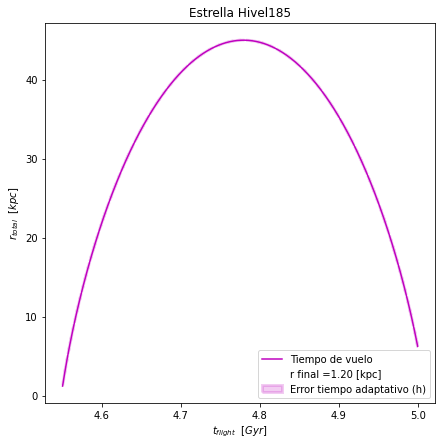

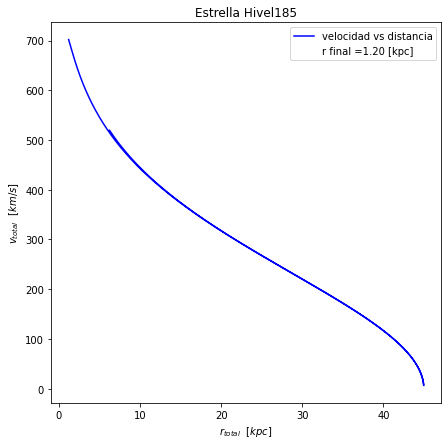

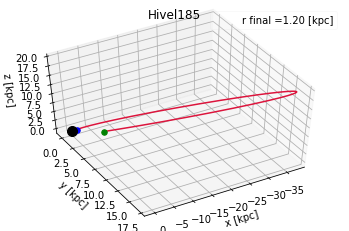

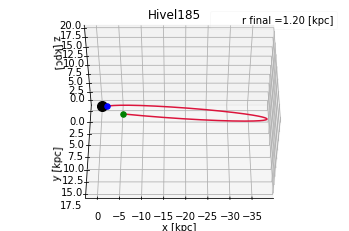

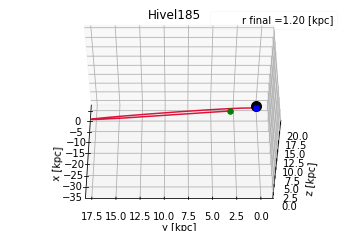

...

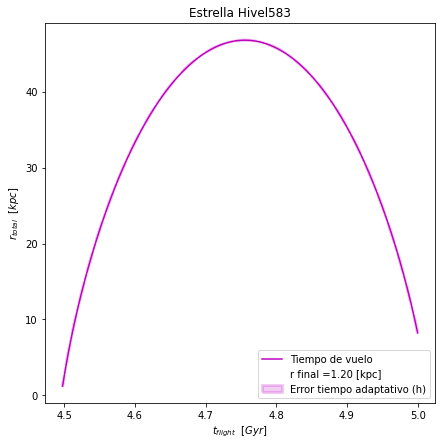

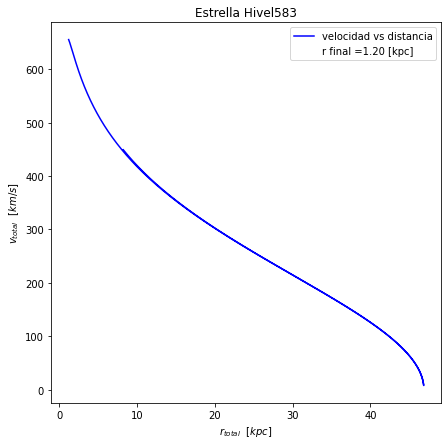

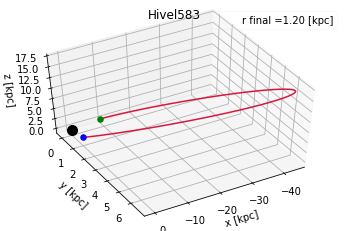

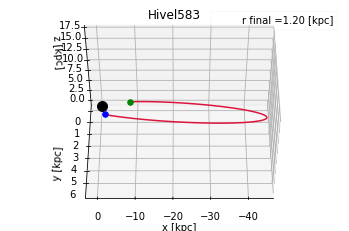

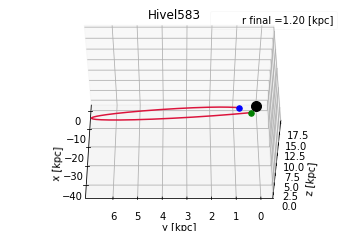

In [ ]:
#Generamos un ciclo que recorra uno a uno el dataset de las probables HVS

final_data = []
virial = []


for i in range(len(datos)):
  #Posicion inicial
  eta = 1e-6
  

  x0 = datos.loc[i,'x']   #[kpc]                
  y0 = datos.loc[i,'y']    #[kpc]
  z0 = datos.loc[i,'z']    #[kpc]
  M_e = datos.loc[i,'Masas_M_sun'] # Masa en masas solares
  #Velocidad  inicial
  vx0 = -datos.loc[i,'Vx']  #[km/s] 
  vy0 = -datos.loc[i,'Vy']  #[km/s]  
  vz0 = -datos.loc[i,'Vz']  #[km/s] 

  x = x0   #componente x de la posición
  y = y0   #componente y de la posición
  z = z0   #componente z de la posición

  vx = vx0 #componente x de la velocidad
  vy = vy0 #componente y de la velocidad
  vz = vz0 #componente z de la velocidad

  acelx = 0.0
  acely = 0.0
  acelz = 0.0
  t0 = 5.0 #tiempo inicial en Gyr

  r = np.sqrt (x**2+ y**2+ z**2)
  R = np.sqrt(x**2+y**2)
  v_all = np.sqrt(vx**2+vy**2+vz**2)

  posx=[x]
  posy=[y]
  posz=[z]
  velx=[vx]
  vely=[vy]
  velz =[vz]
  acex = [acelx]
  acey = [acely]
  acez = [acelz]
  tiempo = [t0]
  r_GCC =[r]
  R_GCC =[R]
  v_total = [v_all]
  h_list = [0]

  ddist_real = []

  while t0 >= 0.0:
    r = np.sqrt(x*x+y*y+z*z)
    R = np.sqrt(x**2+y**2)
    #print(r)  
    if r >= 1.2: # Umbral nucleo      
      acel(x,y,z)
      h = (eta/np.sqrt(acelx**2+acely**2+acelz**2))**0.5
      kick(h)
      drift(h)
      acel(x,y,z)
      kick(h)
      t0 = t0 - h
      h_list.append(h)
      posx.append(x)
      posy.append(y)
      posz.append(z)
      velx.append(vx)
      vely.append(vy)
      velz.append(vz)
      acex.append(acelx)
      acey.append(acely)
      acez.append(acelz)
      tiempo.append(t0)
      r_GCC.append(r)
      R_GCC.append(R)
      v_total.append(np.sqrt(vx**2+vy**2+vz**2))

    else:
      #print('pare',r,t0)
      #dist_real = np.sum(ddist_real)
      dist_real = np.sum(np.abs(np.diff(r_GCC)))
      final_data +=[[datos.loc[i,'ID'], r, 5-t0, dist_real]]
      break
    
    r1 = np.sqrt(x*x+y*y+z*z)
    ddist_real += np.abs([r1-r])

  

  Star_back = pd.DataFrame({'t_Gyr':tiempo,'x':posx,'y':posy,'z':posz,'vx':velx,'vy':vely,'vz':velz,'ax':acex,'ay':acey,'az':acez,'r_total':r_GCC,'R_total':R_GCC,'v_total':v_total,'time_adap(h)':h_list})
  Star_back['Epot_n'] = M_e*(-G2*M_n/(Star_back['r_total'] + r_n)) # Energía potencial núcleo
  Star_back['Epot_b'] = M_e*(-G2*M_b/(Star_back['r_total'] + r_b)) #Energía potencial bulbo
  Star_back['Epot_d'] = M_e*(-G2*M_d/np.sqrt(Star_back['R_total']**2+(a_d + np.sqrt(Star_back['z']**2 + b_d**2))**2)) #Energia potencial disco
  Star_back['Epot_h'] = M_e*(-G2*M_h*np.log(1+(Star_back['r_total']/r_s))/Star_back['r_total']) #Energía potencial halo
  Star_back['Epot_total'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d'] + Star_back['Epot_h']
  Star_back['Epot_semitotal'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d']
  Star_back['Ek_star'] = 0.5*M_e*Star_back['v_total']**2
  Star_back['Error_h'] = Star_back['time_adap(h)']**2 /np.max(Star_back['time_adap(h)'])
  

  Star_back.to_csv(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/{datos.loc[i,'ID']}")
  
  #Graficamos la posición vs. tiempo de vuelo
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['t_Gyr'],Star_back['r_total'],color='m',label='Tiempo de vuelo')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.fill_betweenx(Star_back['r_total'], Star_back['t_Gyr'] - Star_back['Error_h'], Star_back['t_Gyr'] + Star_back['Error_h'], color='m', ls = '-.',lw= 3,alpha=0.2,edgecolor='black', label = 'Error tiempo adaptativo (h)')
  plt.xlabel("$t_{flight}$  $[Gyr]$")
  plt.ylabel("$r_{total}$  $[kpc]$")
  plt.title(f"Estrella {datos.loc[i,'ID']}")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/posicion_tiempo_flight_{datos.loc[i,'ID']}.png")
  #Graficamos la velocidad total vs. posición
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['r_total'],Star_back['v_total'],color='b', label ='velocidad vs distancia')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.xlabel("$r_{total}$  $[kpc]$")
  plt.ylabel("$v_{total}$  $[km/s]$")
  plt.title(f"Estrella {datos.loc[i,'ID']}")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/v_total_posicion_{datos.loc[i,'ID']}.png")
  #Ahora hacemos una gráfica 3D
  for l in (60,90,180):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot3D(posx, posy, posz, 'crimson')
    ax.plot([], [], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
    ax.scatter3D(x0,y0,z0, c='green', s=30)
    ax.scatter3D(0,0,0, c='black', s=100)
    ax.scatter3D(posx[-1],posy[-1],posz[-1], c='blue', s=30)
    ax.set_xlabel('x [kpc]')
    #ax.set_xlim(-10,10)
    ax.set_ylabel('y [kpc]')
    #ax.set_ylim(-15,15)
    ax.set_zlabel('z [kpc]')
    #ax.set_zlim(-15,15)
    ax.view_init(elev=50., azim=l)
    plt.title(f"{datos.loc[i,'ID']}")
    plt.legend(fancybox=True, framealpha=0.1)
    plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/3D_tiempo_flight_{l}_{datos.loc[i,'ID']}.png")

  

In [ ]:
# Guardamos los datos de cada estrella relacionados con su ID, si llegó o no a un r de 1.2 kpc, su tiempo de vuelo y la distancia orbital recorrida
final_data_df = pd.DataFrame(final_data, columns=['ID', 'r[kpc]', 'tv[Gyrs]', 'distancia[kpc]'])

In [ ]:
final_data_df.to_csv('/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/Datos_finales_HVS.csv', index=False)

In [ ]:
final_data_df

,ID,r[kpc],tv[Gyrs],distancia[kpc]
0,Hivel185,1.196846,0.449790,82.518193
1,Hivel254,1.199816,0.743369,120.456566
2,Hivel265,1.199544,0.086025,20.678322
3,Hivel308,1.197694,0.323836,62.672806
4,Hivel345,1.198888,1.005974,153.908396
5,Hivel385,1.199576,0.011835,6.579563
6,Hivel418,1.198103,0.014002,6.879414
7,Hivel465,1.199148,0.361369,65.645305
8,Hivel486,1.199328,0.089663,21.327833
9,Hivel487,1.198831,0.012994,6.344975


In [ ]:
# Incluimos la rapidez
final_data_df['rapidez_M'] = final_data_df['r[kpc]']/final_data_df['tv[Gyrs]']

In [ ]:
estrellas_masa = datos.merge(final_data_df, on=['ID'], how='outer') #hacemos el merge de los dos df

In [ ]:
estrellas_masa

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,virial,E_tabla,virial_II,E_total_tabla,M_e_inf,M_e_sup,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,6.214366e+04,Desligada,-21831.164475,LigadaII,0.586710,0.754325,1.196846,0.449790,82.518193,2.660899
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,1.089455e+06,Desligada,-384553.793446,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,6.833023e+04,Desligada,-32823.366117,LigadaII,0.387072,1.219222,1.199816,0.743369,120.456566,1.614024
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,2.814637e+04,Desligada,-16532.265784,LigadaII,0.283730,0.419468,1.199544,0.086025,20.678322,13.944215
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,9.733928e+04,Desligada,-40721.655044,LigadaII,1.001508,1.386139,NaN,NaN,NaN,NaN
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,4.874078e+04,Desligada,-23221.912549,LigadaII,0.460220,0.782374,1.197694,0.323836,62.672806,3.698460
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,3.742923e+05,Desligada,-161337.610675,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,6.869403e+04,Desligada,-33467.652136,LigadaII,0.734234,1.036955,1.198888,1.005974,153.908396,1.191768
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,5.189224e+04,Desligada,-29803.748296,LigadaII,0.542516,0.885669,1.199576,0.011835,6.579563,101.359487
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,1.091315e+05,Desligada,-61773.142468,LigadaII,1.023214,1.706838,1.198103,0.014002,6.879414,85.569321


In [ ]:
estrellas_masa.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Gaia_designation', 'ID', 'specid',
       'R.A.', 'e_R.A.', 'decl.', 'e_decl.', 'S/N_r',
       ...
       'virial', 'E_tabla', 'virial_II', 'E_total_tabla', 'M_e_inf', 'M_e_sup',
       'r[kpc]', 'tv[Gyrs]', 'distancia[kpc]', 'rapidez_M'],
      dtype='object', length=121)

In [ ]:
# Nos quedamos unicamente cone strellas que nos interesen
cols_int = ['ID',	'r[kpc]',	'tv[Gyrs]',	'distancia[kpc]',	'rapidez_M','Class',\
            'Teff_LASP', 'e_Teff_LASP',\
            '[Fe/H]_LASP',\
            'Vesc(M)', 'Pgc','Pub(M)',\
            'Masas_M_sun','M_e_sup','G','G_BP',	'G_RP','r_GC','r']
estrellas_masa=estrellas_masa[cols_int]
estrellas_masa.head(26)

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M,Class,Teff_LASP,e_Teff_LASP,[Fe/H]_LASP,Vesc(M),Pgc,Pub(M),Masas_M_sun,M_e_sup,G,G_BP,G_RP,r_GC,r
0,Hivel185,1.196846,0.449790,82.518193,2.660899,G8,4808,77,-0.94,536,0.366,0.387,0.671272,0.754325,13.62,12.64,11.60,6.3,4.6
1,Hivel230,NaN,NaN,NaN,NaN,F5,5940,26,-1.01,527,0.281,0.373,11.968516,NaN,13.49,12.14,11.51,6.9,4.8
2,Hivel254,1.199816,0.743369,120.456566,1.614024,G3,4942,25,-1.46,534,0.182,0.218,0.811652,1.219222,13.12,16.72,14.37,6.4,5.0
3,Hivel265,1.199544,0.086025,20.678322,13.944215,G5,4470,133,-1.14,548,0.566,0.270,0.351131,0.419468,12.58,17.90,15.47,5.6,4.5
4,Hivel289,NaN,NaN,NaN,NaN,G2,5368,43,-1.26,518,0.290,0.288,1.142632,1.386139,15.06,13.96,12.61,7.7,3.2
5,Hivel308,1.197694,0.323836,62.672806,3.698460,F0,6063,298,-1.37,515,0.303,0.322,0.597531,0.782374,16.01,16.35,13.90,7.9,2.1
6,Hivel310,NaN,NaN,NaN,NaN,F5,5631,36,-1.16,516,0.282,0.301,4.433093,NaN,13.12,13.45,12.61,7.8,4.1
7,Hivel345,1.198888,1.005974,153.908396,1.191768,F0,6197,66,-1.67,511,0.262,0.183,0.854754,1.036955,14.55,12.99,11.30,8.2,1.7
8,Hivel385,1.199576,0.011835,6.579563,101.359487,F5,5977,176,-1.33,516,0.991,0.167,0.677136,0.885669,15.66,16.35,15.66,7.8,1.8
9,Hivel418,1.198103,0.014002,6.879414,85.569321,F0,6155,32,-1.41,512,0.594,0.235,1.426152,1.706838,15.37,15.62,14.95,8.1,3.1


In [ ]:
estrellas_masa.to_csv('/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/estrellas_masa_calculada_HVS.csv', index=False)

#Estrellas de baja masa

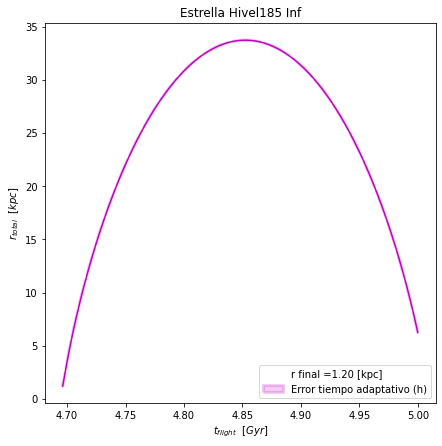

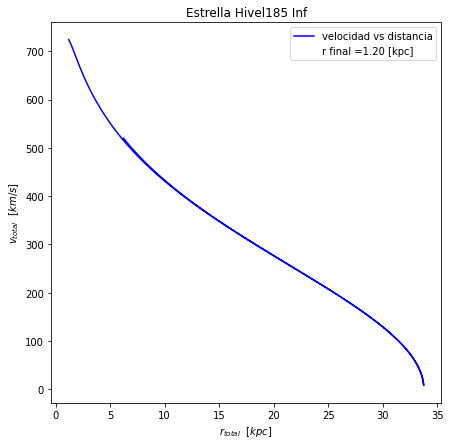

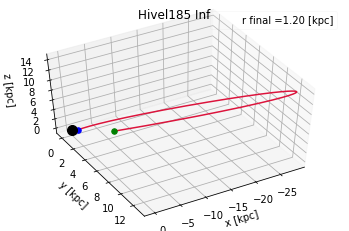

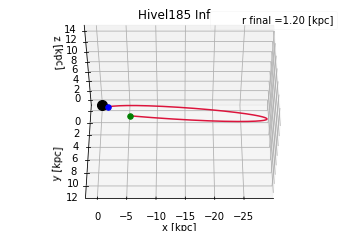

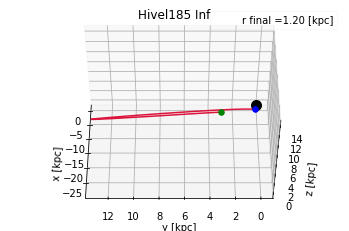

...

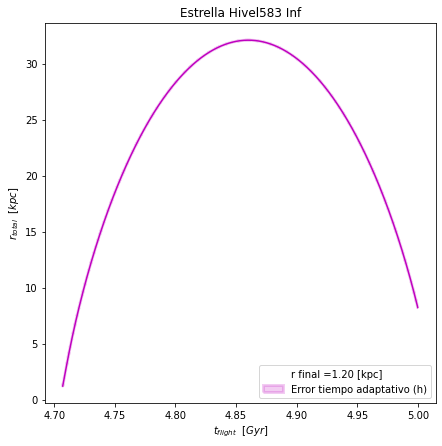

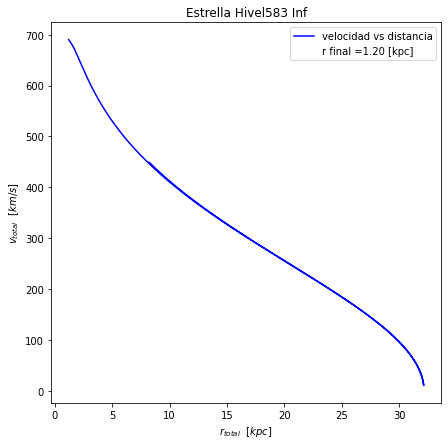

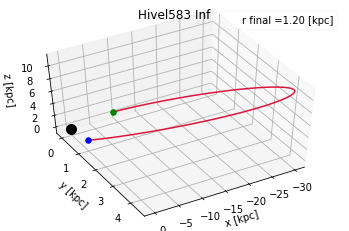

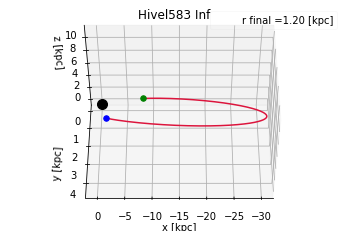

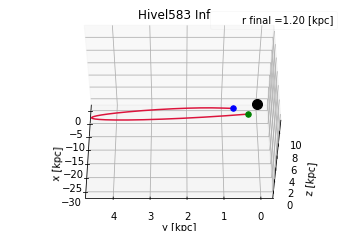

In [ ]:
#Generamos un ciclo que recorra uno a uno el dataset de las probables HVS

final_data_M_inf = []
virial = []


for i in range(len(datos)):
  #Posicion inicial
  #estrella de la fila 385
  eta = 1e-6
  

  x0 = datos.loc[i,'x']   #[kpc]                
  y0 = datos.loc[i,'y']    #[kpc]
  z0 = datos.loc[i,'z']    #[kpc]
  M_e = datos.loc[i,'M_e_inf'] # Masa calculada en masas solares
  
  #Velocidad  inicial
  vx0 = -datos.loc[i,'Vx']  #[km/s] 
  vy0 = -datos.loc[i,'Vy']  #[km/s]  
  vz0 = -datos.loc[i,'Vz']  #[km/s] 

  x = x0   #componente x de la posición
  y = y0   #componente y de la posición
  z = z0   #componente z de la posición

  vx = vx0 #componente x de la velocidad
  vy = vy0 #componente y de la velocidad
  vz = vz0 #componente z de la velocidad

  acelx = 0.0
  acely = 0.0
  acelz = 0.0
  t0 = 5.0 #tiempo inicial en Gyr

  r = np.sqrt (x**2+ y**2+ z**2)
  R = np.sqrt(x**2+y**2)
  v_all = np.sqrt(vx**2+vy**2+vz**2)

  posx=[x]
  posy=[y]
  posz=[z]
  velx=[vx]
  vely=[vy]
  velz =[vz]
  acex = [acelx]
  acey = [acely]
  acez = [acelz]
  tiempo = [t0]
  r_GCC =[r]
  R_GCC =[R]
  v_total = [v_all]
  h_list = [0]

  ddist_real = []

  while t0 >= 0.0:
    r = np.sqrt(x*x+y*y+z*z)
    R = np.sqrt(x**2+y**2)
      
    if r >= 1.2: # Umbral nucleo      
      acel(x,y,z)
      h = (eta/np.sqrt(acelx**2+acely**2+acelz**2))**0.5
      kick(h)
      drift(h)
      acel(x,y,z)
      kick(h)
      t0 = t0 - h
      h_list.append(h)
      posx.append(x)
      posy.append(y)
      posz.append(z)
      velx.append(vx)
      vely.append(vy)
      velz.append(vz)
      acex.append(acelx)
      acey.append(acely)
      acez.append(acelz)
      tiempo.append(t0)
      r_GCC.append(r)
      R_GCC.append(R)
      v_total.append(np.sqrt(vx**2+vy**2+vz**2))

    else:
      dist_real = np.sum(np.abs(np.diff(r_GCC)))
      final_data_M_inf +=[[datos.loc[i,'ID'], r, 5-t0, dist_real]]
      break
    
    r1 = np.sqrt(x*x+y*y+z*z)
    ddist_real += np.abs([r1-r])

  

  Star_back = pd.DataFrame({'t_Gyr':tiempo,'x':posx,'y':posy,'z':posz,'vx':velx,'vy':vely,'vz':velz,'ax':acex,'ay':acey,'az':acez,'r_total':r_GCC,'R_total':R_GCC,'v_total':v_total,'time_adap(h)':h_list})
  Star_back['Epot_n'] = M_e*(-G2*M_n/(Star_back['r_total'] + r_n)) # Energía potencial núcleo
  Star_back['Epot_b'] = M_e*(-G2*M_b/(Star_back['r_total'] + r_b)) #Energía potencial bulbo
  Star_back['Epot_d'] = M_e*(-G2*M_d/np.sqrt(Star_back['R_total']**2+(a_d + np.sqrt(Star_back['z']**2 + b_d**2))**2)) #Energia potencial disco
  Star_back['Epot_h'] = M_e*(-G2*M_h*np.log(1+(Star_back['r_total']/r_s))/Star_back['r_total']) #Energía potencial halo
  Star_back['Epot_total'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d'] + Star_back['Epot_h'] #Energía potencial con el halo incluido
  Star_back['Epot_semitotal'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d'] #Energía potencial sin incluir el halo
  Star_back['Ek_star'] = 0.5*M_e*Star_back['v_total']**2 #Energía cinética
  Star_back['Error_h'] = Star_back['time_adap(h)']**2 /np.max(Star_back['time_adap(h)']) # Cálculo del error en el tiempo adaptativo
  

  Star_back.to_csv(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_inf_{datos.loc[i,'ID']}")
  
  #Graficamos la posición vs. tiempo de vuelo
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['t_Gyr'],Star_back['r_total'],color='m')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.fill_betweenx(Star_back['r_total'], Star_back['t_Gyr'] - Star_back['Error_h'], Star_back['t_Gyr'] + Star_back['Error_h'], color='m', ls = '-.',lw= 3,alpha=0.2,edgecolor='black', label = 'Error tiempo adaptativo (h)')
  plt.xlabel("$t_{flight}$  $[Gyr]$")
  plt.ylabel("$r_{total}$  $[kpc]$")
  plt.title(f"Estrella {datos.loc[i,'ID']} Inf")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_inf_posicion_tiempo_flight_{datos.loc[i,'ID']}.png")
  #Graficamos la velocidad total vs. posición
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['r_total'],Star_back['v_total'],color='b', label ='velocidad vs distancia')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.xlabel("$r_{total}$  $[kpc]$")
  plt.ylabel("$v_{total}$  $[km/s]$")
  plt.title(f"Estrella {datos.loc[i,'ID']} Inf")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_inf_v_total_posicion_{datos.loc[i,'ID']}.png")
  #Ahora hacemos una gráfica 3D
  for l in (60,90,180):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot3D(posx, posy, posz, 'crimson')
    ax.plot([], [], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
    ax.scatter3D(x0,y0,z0, c='green', s=30)
    ax.scatter3D(0,0,0, c='black', s=100)
    ax.scatter3D(posx[-1],posy[-1],posz[-1], c='blue', s=30)
    ax.set_xlabel('x [kpc]')
    #ax.set_xlim(-10,10)
    ax.set_ylabel('y [kpc]')
    #ax.set_ylim(-15,15)
    ax.set_zlabel('z [kpc]')
    #ax.set_zlim(-15,15)
    ax.view_init(elev=50., azim=l)
    plt.title(f"{datos.loc[i,'ID']} Inf")
    plt.legend(fancybox=True, framealpha=0.1)
    plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_inf_3D_tiempo_flight_{l}_{datos.loc[i,'ID']}.png")

  

In [ ]:
# Guardamos los datos de cada estrella relacionados con su ID, si llegó o no a un r de 1.2 kpc, su tiempo de vuelo y la distancia orbital recorrida
final_df_inf = pd.DataFrame(final_data_M_inf, columns=['ID', 'r[kpc]', 'tv[Gyrs]', 'distancia[kpc]'])

In [ ]:
final_df_inf['rapidez_M_inf'] = final_df_inf['r[kpc]']/final_df_inf['tv[Gyrs]']
final_df_inf

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_inf
0,Hivel185,1.198362,0.303725,60.055331,3.945545
1,Hivel254,1.198382,0.116694,27.165744,10.269421
2,Hivel265,1.199497,0.062236,16.138160,19.273419
3,Hivel289,1.198700,2.674595,333.879596,0.448180
4,Hivel308,1.199026,0.183058,39.962469,6.549978
5,Hivel345,1.198880,0.581157,99.617935,2.062919
6,Hivel385,1.198459,0.011488,6.580781,104.324101
7,Hivel418,1.199108,0.013561,6.878657,88.423482
8,Hivel438,1.198563,1.328060,185.898601,0.902491
9,Hivel465,1.199563,0.329703,60.994859,3.638311


## Agregamos los campos del Dataframe llamado datos y eliminamos las columnas indeseadas

In [ ]:
estrellas_masa_inf_all = datos.merge(final_df_inf, on=['ID'], how='outer') #hacemos el merge de los dos df

In [ ]:
estrellas_masa_inf_all

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,virial,E_tabla,virial_II,E_total_tabla,M_e_inf,M_e_sup,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_inf
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,6.214366e+04,Desligada,-21831.164475,LigadaII,0.586710,0.754325,1.198362,0.303725,60.055331,3.945545
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,1.089455e+06,Desligada,-384553.793446,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,6.833023e+04,Desligada,-32823.366117,LigadaII,0.387072,1.219222,1.198382,0.116694,27.165744,10.269421
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,2.814637e+04,Desligada,-16532.265784,LigadaII,0.283730,0.419468,1.199497,0.062236,16.138160,19.273419
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,9.733928e+04,Desligada,-40721.655044,LigadaII,1.001508,1.386139,1.198700,2.674595,333.879596,0.448180
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,4.874078e+04,Desligada,-23221.912549,LigadaII,0.460220,0.782374,1.199026,0.183058,39.962469,6.549978
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,3.742923e+05,Desligada,-161337.610675,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,6.869403e+04,Desligada,-33467.652136,LigadaII,0.734234,1.036955,1.198880,0.581157,99.617935,2.062919
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,5.189224e+04,Desligada,-29803.748296,LigadaII,0.542516,0.885669,1.198459,0.011488,6.580781,104.324101
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,1.091315e+05,Desligada,-61773.142468,LigadaII,1.023214,1.706838,1.199108,0.013561,6.878657,88.423482


In [ ]:
#estrellas_masa_infe = estrellas_masa_inf_all.drop(columns=['Unnamed: 0','Unnamed: 0.1'],axis=1) #Eliminamos las columnas indeseadas

In [ ]:
estrellas_masa_inf_all

,Unnamed: 0,Unnamed: 0.1,Gaia_designation,ID,specid,R.A.,e_R.A.,decl.,e_decl.,S/N_r,...,virial,E_tabla,virial_II,E_total_tabla,M_e_inf,M_e_sup,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_inf
0,184,184,4552754742098901504,Hivel185,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,0.0211,86,...,6.214366e+04,Desligada,-21831.164475,LigadaII,0.586710,0.754325,1.198362,0.303725,60.055331,3.945545
1,229,229,4595327282568833152,Hivel230,20140320HD172545N271812V0113162_v2.9.7,262.938053,0.0115,28.077309,0.0154,100,...,1.089455e+06,Desligada,-384553.793446,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
2,253,253,4557012394719359616,Hivel254,20170416HD172149N234110V0106117_v2.9.7,262.768439,0.0071,22.495683,0.0102,155,...,6.833023e+04,Desligada,-32823.366117,LigadaII,0.387072,1.219222,1.198382,0.116694,27.165744,10.269421
3,264,264,4410589469176268416,Hivel265,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,0.0178,20,...,2.814637e+04,Desligada,-16532.265784,LigadaII,0.283730,0.419468,1.199497,0.062236,16.138160,19.273419
4,288,288,1239855357825463424,Hivel289,20150210HD141904N190355B0209220_v2.9.7,215.507573,0.0190,19.602365,0.0230,86,...,9.733928e+04,Desligada,-40721.655044,LigadaII,1.001508,1.386139,1.198700,2.674595,333.879596,0.448180
5,307,307,1247482768771074432,Hivel308,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,0.0428,32,...,4.874078e+04,Desligada,-23221.912549,LigadaII,0.460220,0.782374,1.199026,0.183058,39.962469,6.549978
6,309,309,3725136049056254592,Hivel310,20140322HD134851N094247V05198_v2.9.7,206.188660,0.0211,9.068783,0.0194,113,...,3.742923e+05,Desligada,-161337.610675,LigadaII,NaN,NaN,NaN,NaN,NaN,NaN
7,344,344,3698771035828394368,Hivel345,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,0.0223,70,...,6.869403e+04,Desligada,-33467.652136,LigadaII,0.734234,1.036955,1.198880,0.581157,99.617935,2.062919
8,384,384,1267516459040509056,Hivel385,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,0.0335,37,...,5.189224e+04,Desligada,-29803.748296,LigadaII,0.542516,0.885669,1.198459,0.011488,6.580781,104.324101
9,417,417,1477370691426238720,Hivel418,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,0.0311,106,...,1.091315e+05,Desligada,-61773.142468,LigadaII,1.023214,1.706838,1.199108,0.013561,6.878657,88.423482


In [ ]:
estrellas_masa_inf_all['Masa_LI'] =estrellas_masa_inf_all['Masas_M_sun'] - estrellas_masa_inf_all['M_e_inf']
estrellas_masa_inf_all['Masa_LS'] =estrellas_masa_inf_all['M_e_sup'] - estrellas_masa_inf_all['Masas_M_sun']

In [ ]:
# Seleccionamos las columnas que más nos convengan para extraer del merge
cols_int = ['ID',	'r[kpc]',	'tv[Gyrs]',	'distancia[kpc]',	'rapidez_M_inf','Class',\
            'Teff_LASP', 'e_Teff_LASP',\
            '[Fe/H]_LASP','V_GC',\
            'Vesc(M)', 'Pgc','Pub(M)',\
            'Masas_M_sun','M_e_sup','G','G_BP',	'G_RP', 'Masa_LI','Masa_LS']
estrellas_masa_infe=estrellas_masa_inf_all[cols_int]
estrellas_masa_infe.head(26)

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_inf,Class,Teff_LASP,e_Teff_LASP,[Fe/H]_LASP,V_GC,Vesc(M),Pgc,Pub(M),Masas_M_sun,M_e_sup,G,G_BP,G_RP,Masa_LI,Masa_LS
0,Hivel185,1.198362,0.303725,60.055331,3.945545,G8,4808,77,-0.94,521,536,0.366,0.387,0.671272,0.754325,13.62,12.64,11.60,0.084562,0.083053
1,Hivel230,NaN,NaN,NaN,NaN,F5,5940,26,-1.01,508,527,0.281,0.373,11.968516,NaN,13.49,12.14,11.51,NaN,NaN
2,Hivel254,1.198382,0.116694,27.165744,10.269421,G3,4942,25,-1.46,500,534,0.182,0.218,0.811652,1.219222,13.12,16.72,14.37,0.424580,0.407570
3,Hivel265,1.199497,0.062236,16.138160,19.273419,G5,4470,133,-1.14,496,548,0.566,0.270,0.351131,0.419468,12.58,17.90,15.47,0.067401,0.068337
4,Hivel289,1.198700,2.674595,333.879596,0.448180,G2,5368,43,-1.26,490,518,0.290,0.288,1.142632,1.386139,15.06,13.96,12.61,0.141124,0.243507
5,Hivel308,1.199026,0.183058,39.962469,6.549978,F0,6063,298,-1.37,486,515,0.303,0.322,0.597531,0.782374,16.01,16.35,13.90,0.137311,0.184843
6,Hivel310,NaN,NaN,NaN,NaN,F5,5631,36,-1.16,486,516,0.282,0.301,4.433093,NaN,13.12,13.45,12.61,NaN,NaN
7,Hivel345,1.198880,0.581157,99.617935,2.062919,F0,6197,66,-1.67,480,511,0.262,0.183,0.854754,1.036955,14.55,12.99,11.30,0.120520,0.182201
8,Hivel385,1.198459,0.011488,6.580781,104.324101,F5,5977,176,-1.33,476,516,0.991,0.167,0.677136,0.885669,15.66,16.35,15.66,0.134620,0.208533
9,Hivel418,1.199108,0.013561,6.878657,88.423482,F0,6155,32,-1.41,470,512,0.594,0.235,1.426152,1.706838,15.37,15.62,14.95,0.402939,0.280685


## Finalmente guardamos este dataset con el límite inferior de Masa estelar

In [ ]:
estrellas_masa_infe.to_csv('/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/Datos_finales_HVS_Masa_inf.csv', index=False)

# Estrellas alta masa

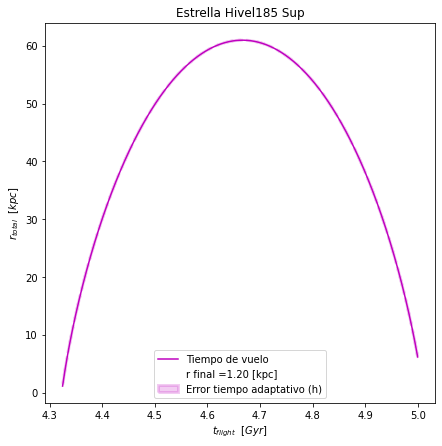

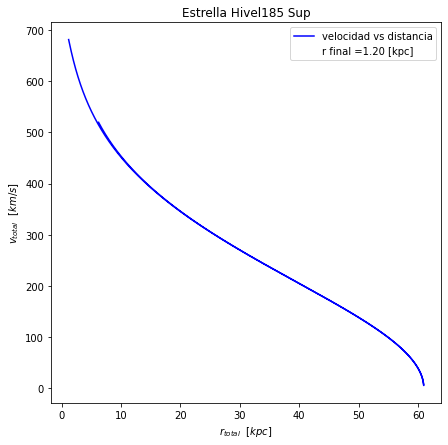

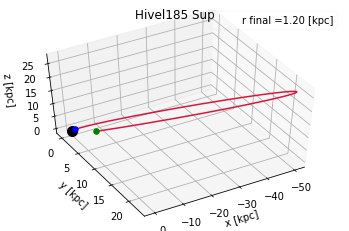

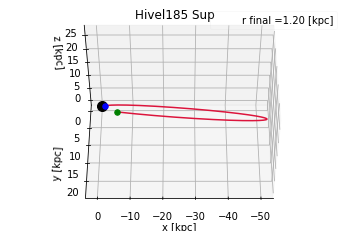

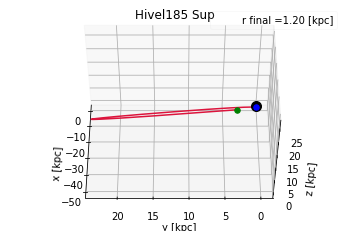

...

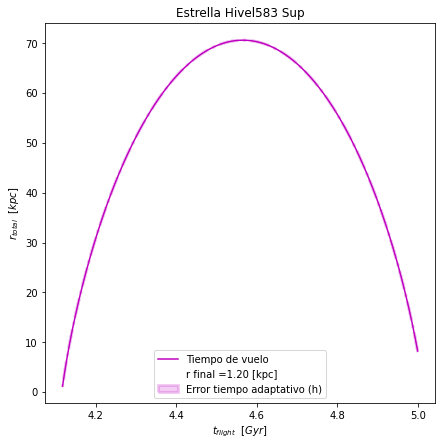

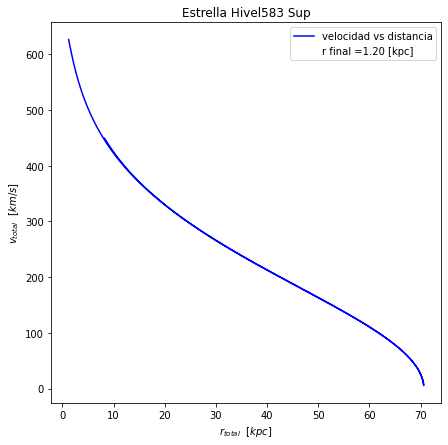

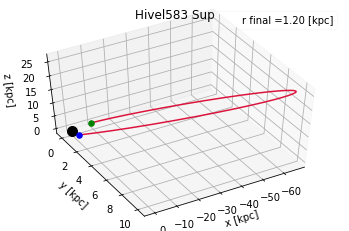

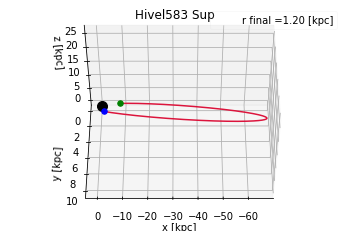

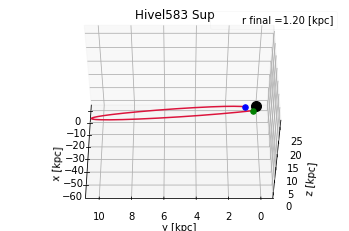

In [ ]:
#Generamos un ciclo que recorra uno a uno el dataset de las probables HVS

final_data_M_sup = []
virial = []


for i in range(len(datos)):
  #Posicion inicial
 
  eta = 1e-6
  

  x0 = datos.loc[i,'x']   #[kpc]                
  y0 = datos.loc[i,'y']    #[kpc]
  z0 = datos.loc[i,'z']    #[kpc]
  M_e = datos.loc[i,'M_e_sup'] # Masa en masas solares 
  #Velocidad  inicial
  vx0 = -datos.loc[i,'Vx']  #[km/s] 
  vy0 = -datos.loc[i,'Vy']  #[km/s]  
  vz0 = -datos.loc[i,'Vz']  #[km/s] 

  x = x0   #componente x de la posición
  y = y0   #componente y de la posición
  z = z0   #componente z de la posición

  vx = vx0 #componente x de la velocidad
  vy = vy0 #componente y de la velocidad
  vz = vz0 #componente z de la velocidad

  acelx = 0.0
  acely = 0.0
  acelz = 0.0
  t0 = 5.0 #tiempo inicial en Gyr

  r = np.sqrt (x**2+ y**2+ z**2)
  R = np.sqrt(x**2+y**2)
  v_all = np.sqrt(vx**2+vy**2+vz**2)

  posx=[x]
  posy=[y]
  posz=[z]
  velx=[vx]
  vely=[vy]
  velz =[vz]
  acex = [acelx]
  acey = [acely]
  acez = [acelz]
  tiempo = [t0]
  r_GCC =[r]
  R_GCC =[R]
  v_total = [v_all]
  h_list = [0]

  ddist_real = []

  while t0 >= 0.0:
    r = np.sqrt(x*x+y*y+z*z)
    R = np.sqrt(x**2+y**2)
    #print(r)  
    if r >= 1.2: # Umbral nucleo      
      acel(x,y,z)
      h = (eta/np.sqrt(acelx**2+acely**2+acelz**2))**0.5
      kick(h)
      drift(h)
      acel(x,y,z)
      kick(h)
      t0 = t0 - h
      h_list.append(h)
      posx.append(x)
      posy.append(y)
      posz.append(z)
      velx.append(vx)
      vely.append(vy)
      velz.append(vz)
      acex.append(acelx)
      acey.append(acely)
      acez.append(acelz)
      tiempo.append(t0)
      r_GCC.append(r)
      R_GCC.append(R)
      v_total.append(np.sqrt(vx**2+vy**2+vz**2))

    else:
      #print('pare',r,t0)
      #dist_real = np.sum(ddist_real)
      dist_real = np.sum(np.abs(np.diff(r_GCC)))
      final_data_M_sup +=[[datos.loc[i,'ID'], r, 5-t0, dist_real]]
      break
    
    r1 = np.sqrt(x*x+y*y+z*z)
    ddist_real += np.abs([r1-r])

  

  Star_back = pd.DataFrame({'t_Gyr':tiempo,'x':posx,'y':posy,'z':posz,'vx':velx,'vy':vely,'vz':velz,'ax':acex,'ay':acey,'az':acez,'r_total':r_GCC,'R_total':R_GCC,'v_total':v_total,'time_adap(h)':h_list})
  Star_back['Epot_n'] = M_e*(-G2*M_n/(Star_back['r_total'] + r_n)) # Energía potencial núcleo
  Star_back['Epot_b'] = M_e*(-G2*M_b/(Star_back['r_total'] + r_b)) #Energía potencial bulbo
  Star_back['Epot_d'] = M_e*(-G2*M_d/np.sqrt(Star_back['R_total']**2+(a_d + np.sqrt(Star_back['z']**2 + b_d**2))**2)) #Energia potencial disco
  Star_back['Epot_h'] = M_e*(-G2*M_h*np.log(1+(Star_back['r_total']/r_s))/Star_back['r_total']) #Energía potencial halo
  Star_back['Epot_total'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d'] + Star_back['Epot_h'] #Energía potencial con el halo incluido
  Star_back['Epot_semitotal'] = Star_back['Epot_n'] + Star_back['Epot_b'] + Star_back['Epot_d'] #Energía potencial sin incluir el halo
  Star_back['Ek_star'] = 0.5*M_e*Star_back['v_total']**2 #Energía cinética
  Star_back['Error_h'] = Star_back['time_adap(h)']**2 /np.max(Star_back['time_adap(h)']) # Cálculo del error en el tiempo adaptativo
  

  Star_back.to_csv(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_sup_{datos.loc[i,'ID']}")
  
  #Graficamos la posición vs. tiempo de vuelo
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['t_Gyr'],Star_back['r_total'],color='m',label='Tiempo de vuelo')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.fill_betweenx(Star_back['r_total'], Star_back['t_Gyr'] - Star_back['Error_h'], Star_back['t_Gyr'] + Star_back['Error_h'], color='m', ls = '-.',lw= 3,alpha=0.2,edgecolor='black', label = 'Error tiempo adaptativo (h)')
  plt.xlabel("$t_{flight}$  $[Gyr]$")
  plt.ylabel("$r_{total}$  $[kpc]$")
  plt.title(f"Estrella {datos.loc[i,'ID']} Sup")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_sup_posicion_tiempo_flight_{datos.loc[i,'ID']}.png")
  #Graficamos la velocidad total vs. posición
  plt.figure(figsize=(7,7))
  plt.plot(Star_back['r_total'],Star_back['v_total'],color='b', label ='velocidad vs distancia')
  plt.plot([], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
  plt.xlabel("$r_{total}$  $[kpc]$")
  plt.ylabel("$v_{total}$  $[km/s]$")
  plt.title(f"Estrella {datos.loc[i,'ID']} Sup")
  plt.legend()
  plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_sup_v_total_posicion_{datos.loc[i,'ID']}.png")
  #Ahora hacemos una gráfica 3D
  for l in (60,90,180):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot3D(posx, posy, posz, 'crimson')
    ax.plot([], [], [], ' ', label=f"r final ={Star_back['r_total'].iloc[-1]:.2f} [kpc]")
    ax.scatter3D(x0,y0,z0, c='green', s=30)
    ax.scatter3D(0,0,0, c='black', s=100)
    ax.scatter3D(posx[-1],posy[-1],posz[-1], c='blue', s=30)
    ax.set_xlabel('x [kpc]')
    #ax.set_xlim(-10,10)
    ax.set_ylabel('y [kpc]')
    #ax.set_ylim(-15,15)
    ax.set_zlabel('z [kpc]')
    #ax.set_zlim(-15,15)
    ax.view_init(elev=50., azim=l)
    plt.title(f"{datos.loc[i,'ID']} Sup")
    plt.legend(fancybox=True, framealpha=0.1)
    plt.savefig(f"/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/Estrellas_diferen_Masas/M_sup_3D_tiempo_flight_{l}_{datos.loc[i,'ID']}.png")

  

In [ ]:
# Guardamos los datos de cada estrella relacionados con su ID, si llegó o no a un r de 1.2 kpc, su tiempo de vuelo y la distancia orbital recorrida
final_df_sup = pd.DataFrame(final_data_M_sup, columns=['ID', 'r[kpc]', 'tv[Gyrs]', 'distancia[kpc]'])

In [ ]:
final_df_sup

,ID,r[kpc],tv[Gyrs],distancia[kpc]
0,Hivel185,1.197618,0.675320,114.461576
1,Hivel265,1.197821,0.116758,26.312762
2,Hivel308,1.197818,0.715787,117.841223
3,Hivel345,1.199370,2.802557,341.899453
4,Hivel385,1.196813,0.012217,6.582169
5,Hivel418,1.197701,0.014207,6.879668
6,Hivel465,1.199417,0.419328,73.959540
7,Hivel486,1.198750,0.114531,25.675038
8,Hivel487,1.198041,0.013085,6.345799
9,Hivel494,1.199068,0.012437,6.260941


In [ ]:
final_df_sup['rapidez_M_sup'] = final_df_sup['r[kpc]']/final_df_sup['tv[Gyrs]']

In [ ]:
final_df_sup

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_sup
0,Hivel185,1.197618,0.675320,114.461576,1.773409
1,Hivel265,1.197821,0.116758,26.312762,10.258987
2,Hivel308,1.197818,0.715787,117.841223,1.673428
3,Hivel345,1.199370,2.802557,341.899453,0.427955
4,Hivel385,1.196813,0.012217,6.582169,97.963015
5,Hivel418,1.197701,0.014207,6.879668,84.304466
6,Hivel465,1.199417,0.419328,73.959540,2.860330
7,Hivel486,1.198750,0.114531,25.675038,10.466618
8,Hivel487,1.198041,0.013085,6.345799,91.558082
9,Hivel494,1.199068,0.012437,6.260941,96.410993


## Agregamos los campos del Dataframe llamado datos y eliminamos las columnas indeseadas

In [ ]:
estrellas_masa_sup = final_df_sup.merge(datos, on=['ID'], how='outer').dropna(subset=['r[kpc]', 'tv[Gyrs]','distancia[kpc]','rapidez_M_sup']) # hacemos el merge con el conjunto de datos completo

In [ ]:
estrellas_masa_supe = estrellas_masa_sup.drop(columns=['Unnamed: 0','Unnamed: 0.1'],axis=1)

In [ ]:
estrellas_masa_supe

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_sup,Gaia_designation,specid,R.A.,e_R.A.,decl.,...,Epot_h,Epot_total,Epot_semitotal,Ek_star,virial,E_tabla,virial_II,E_total_tabla,M_e_inf,M_e_sup
0,Hivel185,1.197618,0.675320,114.461576,1.773409,4552754742098901504,20160418HD175440N181108V0111132_v2.9.7,268.297715,0.0154,20.538730,...,-83974.821005,-112452.925536,-28478.104530,90621.761061,62143.656530,Desligada,-21831.164475,LigadaII,0.586710,0.754325
1,Hivel265,1.197821,0.116758,26.312762,10.258987,4410589469176268416,20130310HD155427N020832B0102074_v2.9.7,237.805691,0.0249,0.402692,...,-44678.634571,-59857.287367,-15178.652796,43325.021583,28146.368787,Desligada,-16532.265784,LigadaII,0.283730,0.419468
2,Hivel308,1.197818,0.715787,117.841223,1.673428,1247482768771074432,20170523HD135706N205714B0113173_v2.9.7,210.887254,0.0433,21.729036,...,-71962.691378,-93149.114692,-21186.423315,69927.202143,48740.778829,Desligada,-23221.912549,LigadaII,0.460220,0.782374
3,Hivel345,1.199370,2.802557,341.899453,0.427955,3698771035828394368,20120215F559730609031_v2.9.7,182.625200,0.0302,-0.002216,...,-102161.683401,-131872.916041,-29711.232639,98405.263905,68694.031266,Desligada,-33467.652136,LigadaII,0.734234,1.036955
4,Hivel385,1.196813,0.012217,6.582169,97.963015,1267516459040509056,20130214HD144325N263140F0108173_v2.9.7,221.487724,0.0330,25.875947,...,-81695.987937,-106213.476094,-24517.488157,76409.727798,51892.239641,Desligada,-29803.748296,LigadaII,0.542516,0.885669
5,Hivel418,1.197701,0.014207,6.879668,84.304466,1477370691426238720,20170402HD141746N331518M0201110_v2.9.7,214.903523,0.0291,31.377989,...,-170904.671016,-219087.018592,-48182.347577,157313.876124,109131.528547,Desligada,-61773.142468,LigadaII,1.023214,1.706838
6,Hivel465,1.199417,0.419328,73.959540,2.860330,4597806440771666432,20140419HD175745N291452V0116227_v2.9.7,268.110686,0.0104,31.285760,...,-81326.196038,-105060.573224,-23734.377186,72258.557377,48524.180191,Desligada,-32802.015846,LigadaII,0.646774,0.709930
7,Hivel486,1.198750,0.114531,25.675038,10.466618,1318462502112720384,20140304HD161644N290900B03166_v2.9.7,243.358831,0.0147,29.222653,...,-40250.616823,-52323.110130,-12072.493307,35242.708908,23170.215601,Desligada,-17080.401222,LigadaII,0.284169,0.387528
8,Hivel487,1.198041,0.013085,6.345799,91.558082,1325089293053553664,20130520HD162945N351206B07100_v2.9.7,249.438989,0.0135,33.465298,...,-105375.204780,-137817.124078,-32441.919298,92483.316975,60041.397677,Desligada,-45333.807103,LigadaII,0.835599,0.907153
9,Hivel494,1.199068,0.012437,6.260941,96.410993,1270017401319252096,20160312HD152134N242036V0204202_v2.9.7,230.710560,0.0130,24.739790,...,-113298.720320,-145406.572710,-32107.852390,98846.160254,66738.307864,Desligada,-46560.412456,LigadaII,0.692902,1.050432


In [ ]:
# seleccionamos las columnas más convenientes para el merge
cols_int = ['ID',	'r[kpc]',	'tv[Gyrs]',	'distancia[kpc]',	'rapidez_M_sup','Class',\
            'Teff_LASP', 'e_Teff_LASP',\
            '[Fe/H]_LASP',\
            'Vesc(M)','V_GC', 'Pgc','Pub(M)',\
            'Masas_M_sun','M_e_sup','G','G_BP',	'G_RP']
estrellas_masa_sup=estrellas_masa_supe[cols_int]
estrellas_masa_sup.head(26)

,ID,r[kpc],tv[Gyrs],distancia[kpc],rapidez_M_sup,Class,Teff_LASP,e_Teff_LASP,[Fe/H]_LASP,Vesc(M),V_GC,Pgc,Pub(M),Masas_M_sun,M_e_sup,G,G_BP,G_RP
0,Hivel185,1.197618,0.675320,114.461576,1.773409,G8,4808,77,-0.94,536,521,0.366,0.387,0.671272,0.754325,13.62,12.64,11.60
1,Hivel265,1.197821,0.116758,26.312762,10.258987,G5,4470,133,-1.14,548,496,0.566,0.270,0.351131,0.419468,12.58,17.90,15.47
2,Hivel308,1.197818,0.715787,117.841223,1.673428,F0,6063,298,-1.37,515,486,0.303,0.322,0.597531,0.782374,16.01,16.35,13.90
3,Hivel345,1.199370,2.802557,341.899453,0.427955,F0,6197,66,-1.67,511,480,0.262,0.183,0.854754,1.036955,14.55,12.99,11.30
4,Hivel385,1.196813,0.012217,6.582169,97.963015,F5,5977,176,-1.33,516,476,0.991,0.167,0.677136,0.885669,15.66,16.35,15.66
5,Hivel418,1.197701,0.014207,6.879668,84.304466,F0,6155,32,-1.41,512,470,0.594,0.235,1.426152,1.706838,15.37,15.62,14.95
6,Hivel465,1.199417,0.419328,73.959540,2.860330,G1,5162,149,-1.61,518,465,0.284,0.184,0.670956,0.709930,13.84,14.47,13.01
7,Hivel486,1.198750,0.114531,25.675038,10.466618,G0,5056,107,-1.52,523,462,0.564,0.139,0.329860,0.387528,14.41,20.28,17.59
8,Hivel487,1.198041,0.013085,6.345799,91.558082,G7,5334,262,-1.37,519,462,0.811,0.002,0.868678,0.907153,14.19,18.82,16.51
9,Hivel494,1.199068,0.012437,6.260941,96.410993,G2,5030,22,-1.43,520,461,0.878,0.155,0.932221,1.050432,13.91,14.36,13.29


## Finalmente guardamos este dataset con el límite superior de Masa estelar

In [ ]:
estrellas_masa_sup.to_csv('/content/drive/MyDrive/ASTRONOMÍA/Seminario_Trabajo_Grado_HVS/HVS_umbral_nucleo/Datos_finales_HVS_Masa_sup.csv', index=False)

# Hacemos las tablas para exportar en formato LateX

In [ ]:
pip install tabulate

In [ ]:
from tabulate import tabulate

In [ ]:
cols_int_2 = ['ID',	'r[kpc]',	'tv[Gyrs]',	'V_GC','distancia[kpc]','Class']
estrellas_masa_super=estrellas_masa_sup[cols_int_2]
estrellas_masa_super.head(26)

,ID,r[kpc],tv[Gyrs],V_GC,distancia[kpc],Class
0,Hivel185,1.197618,0.675320,521,114.461576,G8
1,Hivel265,1.197821,0.116758,496,26.312762,G5
2,Hivel308,1.197818,0.715787,486,117.841223,F0
3,Hivel345,1.199370,2.802557,480,341.899453,F0
4,Hivel385,1.196813,0.012217,476,6.582169,F5
5,Hivel418,1.197701,0.014207,470,6.879668,F0
6,Hivel465,1.199417,0.419328,465,73.959540,G1
7,Hivel486,1.198750,0.114531,462,25.675038,G0
8,Hivel487,1.198041,0.013085,462,6.345799,G7
9,Hivel494,1.199068,0.012437,461,6.260941,G2


In [ ]:
print(tabulate(estrellas_masa_super, cols_int_2, tablefmt="latex"))

\begin{tabular}{rlrrrrl}
\hline
    & ID       &   r[kpc] &   tv[Gyrs] &   V\_GC &   distancia[kpc] & Class   \\
\hline
  0 & Hivel185 &  1.19762 &  0.67532   &    521 &        114.462   & G8      \\
  1 & Hivel265 &  1.19782 &  0.116758  &    496 &         26.3128  & G5      \\
  2 & Hivel308 &  1.19782 &  0.715787  &    486 &        117.841   & F0      \\
  3 & Hivel345 &  1.19937 &  2.80256   &    480 &        341.899   & F0      \\
  4 & Hivel385 &  1.19681 &  0.012217  &    476 &          6.58217 & F5      \\
  5 & Hivel418 &  1.1977  &  0.0142069 &    470 &          6.87967 & F0      \\
  6 & Hivel465 &  1.19942 &  0.419328  &    465 &         73.9595  & G1      \\
  7 & Hivel486 &  1.19875 &  0.114531  &    462 &         25.675   & G0      \\
  8 & Hivel487 &  1.19804 &  0.013085  &    462 &          6.3458  & G7      \\
  9 & Hivel494 &  1.19907 &  0.012437  &    461 &          6.26094 & G2      \\
 10 & Hivel507 &  1.19808 &  1.66502   &    460 &        221.494   & F0      \\


## Fusión datos para Tabla resumen

## Primera fusión (masa inferior con masa promedio)

In [ ]:
df1 = estrellas_masa_infe
df2 = estrellas_masa

df = pd.merge(df1, df2, on='ID', how='left')

In [ ]:
df.dropna()

,ID,r[kpc]_x,tv[Gyrs]_x,distancia[kpc]_x,rapidez_M_inf,Class_x,Teff_LASP_x,e_Teff_LASP_x,[Fe/H]_LASP_x,V_GC,...,Vesc(M)_y,Pgc_y,Pub(M)_y,Masas_M_sun_y,M_e_sup_y,G_y,G_BP_y,G_RP_y,r_GC,r
0,Hivel185,1.198362,0.303725,60.055331,3.945545,G8,4808,77,-0.94,521,...,536,0.366,0.387,0.671272,0.754325,13.62,12.64,11.60,6.3,4.6
2,Hivel254,1.198382,0.116694,27.165744,10.269421,G3,4942,25,-1.46,500,...,534,0.182,0.218,0.811652,1.219222,13.12,16.72,14.37,6.4,5.0
3,Hivel265,1.199497,0.062236,16.138160,19.273419,G5,4470,133,-1.14,496,...,548,0.566,0.270,0.351131,0.419468,12.58,17.90,15.47,5.6,4.5
5,Hivel308,1.199026,0.183058,39.962469,6.549978,F0,6063,298,-1.37,486,...,515,0.303,0.322,0.597531,0.782374,16.01,16.35,13.90,7.9,2.1
7,Hivel345,1.198880,0.581157,99.617935,2.062919,F0,6197,66,-1.67,480,...,511,0.262,0.183,0.854754,1.036955,14.55,12.99,11.30,8.2,1.7
8,Hivel385,1.198459,0.011488,6.580781,104.324101,F5,5977,176,-1.33,476,...,516,0.991,0.167,0.677136,0.885669,15.66,16.35,15.66,7.8,1.8
9,Hivel418,1.199108,0.013561,6.878657,88.423482,F0,6155,32,-1.41,470,...,512,0.594,0.235,1.426152,1.706838,15.37,15.62,14.95,8.1,3.1
12,Hivel465,1.199563,0.329703,60.994859,3.638311,G1,5162,149,-1.61,465,...,518,0.284,0.184,0.670956,0.709930,13.84,14.47,13.01,7.6,6.8
13,Hivel486,1.199861,0.072908,18.327139,16.457168,G0,5056,107,-1.52,462,...,523,0.564,0.139,0.329860,0.387528,14.41,20.28,17.59,7.3,3.7
14,Hivel487,1.199447,0.012912,6.344332,92.891818,G7,5334,262,-1.37,462,...,519,0.811,0.002,0.868678,0.907153,14.19,18.82,16.51,7.5,2.1


## Renombramos las columnas de las masas superiores para que no se genere un dataframe con columnas del mismo nombre

In [ ]:
estrellas_masa_super.columns

Index(['ID', 'r[kpc]', 'tv[Gyrs]', 'V_GC', 'distancia[kpc]', 'Class'], dtype='object')

In [ ]:
estrellas_masa_super.rename(columns={"r[kpc]":"r[kpc]sup","tv[Gyrs]":"tv[Gyrs]sup","distancia[kpc]":"distancia[kpc]sup"},inplace = True)

In [ ]:
estrellas_masa_super

,ID,r[kpc]sup,tv[Gyrs]sup,V_GC,distancia[kpc]sup,Class
0,Hivel185,1.197618,0.675320,521,114.461576,G8
1,Hivel265,1.197821,0.116758,496,26.312762,G5
2,Hivel308,1.197818,0.715787,486,117.841223,F0
3,Hivel345,1.199370,2.802557,480,341.899453,F0
4,Hivel385,1.196813,0.012217,476,6.582169,F5
5,Hivel418,1.197701,0.014207,470,6.879668,F0
6,Hivel465,1.199417,0.419328,465,73.959540,G1
7,Hivel486,1.198750,0.114531,462,25.675038,G0
8,Hivel487,1.198041,0.013085,462,6.345799,G7
9,Hivel494,1.199068,0.012437,461,6.260941,G2


Segunda fusión (anterior tabla con Masas superiores)

In [ ]:
df1 = df
df2 = estrellas_masa_super

df_final = pd.merge(df1, df2, on='ID', how='left')

In [ ]:
df_final.dropna()

,ID,r[kpc]_x,tv[Gyrs]_x,distancia[kpc]_x,rapidez_M_inf,Class_x,Teff_LASP_x,e_Teff_LASP_x,[Fe/H]_LASP_x,V_GC_x,...,G_y,G_BP_y,G_RP_y,r_GC,r,r[kpc]sup,tv[Gyrs]sup,V_GC_y,distancia[kpc]sup,Class
0,Hivel185,1.198362,0.303725,60.055331,3.945545,G8,4808,77,-0.94,521,...,13.62,12.64,11.60,6.3,4.6,1.197618,0.675320,521.0,114.461576,G8
3,Hivel265,1.199497,0.062236,16.138160,19.273419,G5,4470,133,-1.14,496,...,12.58,17.90,15.47,5.6,4.5,1.197821,0.116758,496.0,26.312762,G5
5,Hivel308,1.199026,0.183058,39.962469,6.549978,F0,6063,298,-1.37,486,...,16.01,16.35,13.90,7.9,2.1,1.197818,0.715787,486.0,117.841223,F0
7,Hivel345,1.198880,0.581157,99.617935,2.062919,F0,6197,66,-1.67,480,...,14.55,12.99,11.30,8.2,1.7,1.199370,2.802557,480.0,341.899453,F0
8,Hivel385,1.198459,0.011488,6.580781,104.324101,F5,5977,176,-1.33,476,...,15.66,16.35,15.66,7.8,1.8,1.196813,0.012217,476.0,6.582169,F5
9,Hivel418,1.199108,0.013561,6.878657,88.423482,F0,6155,32,-1.41,470,...,15.37,15.62,14.95,8.1,3.1,1.197701,0.014207,470.0,6.879668,F0
12,Hivel465,1.199563,0.329703,60.994859,3.638311,G1,5162,149,-1.61,465,...,13.84,14.47,13.01,7.6,6.8,1.199417,0.419328,465.0,73.959540,G1
13,Hivel486,1.199861,0.072908,18.327139,16.457168,G0,5056,107,-1.52,462,...,14.41,20.28,17.59,7.3,3.7,1.198750,0.114531,462.0,25.675038,G0
14,Hivel487,1.199447,0.012912,6.344332,92.891818,G7,5334,262,-1.37,462,...,14.19,18.82,16.51,7.5,2.1,1.198041,0.013085,462.0,6.345799,G7
15,Hivel494,1.198840,0.011884,6.261484,100.874964,G2,5030,22,-1.43,461,...,13.91,14.36,13.29,7.5,4.9,1.199068,0.012437,461.0,6.260941,G2


In [ ]:
df_final.columns

Index(['ID', 'r[kpc]_x', 'tv[Gyrs]_x', 'distancia[kpc]_x', 'rapidez_M_inf',
       'Class_x', 'Teff_LASP_x', 'e_Teff_LASP_x', '[Fe/H]_LASP_x', 'V_GC_x',
       'Vesc(M)_x', 'Pgc_x', 'Pub(M)_x', 'Masas_M_sun_x', 'M_e_sup_x', 'G_x',
       'G_BP_x', 'G_RP_x', 'Masa_LI', 'Masa_LS', 'r[kpc]_y', 'tv[Gyrs]_y',
       'distancia[kpc]_y', 'rapidez_M', 'Class_y', 'Teff_LASP_y',
       'e_Teff_LASP_y', '[Fe/H]_LASP_y', 'Vesc(M)_y', 'Pgc_y', 'Pub(M)_y',
       'Masas_M_sun_y', 'M_e_sup_y', 'G_y', 'G_BP_y', 'G_RP_y', 'r_GC', 'r',
       'r[kpc]sup', 'tv[Gyrs]sup', 'V_GC_y', 'distancia[kpc]sup', 'Class'],
      dtype='object')

#Sobre la anterior tabla creamos las columnas con los valores que servirán como límites de las variables distancia recorrida (kpc) y tiempo de vuelo (Gyr)

In [ ]:
# columna de los Límites Inferiores (LI) y Límites Superiores (LS) de distancia recorrida y tiempo de vuelo

df_final['dist_LI'] = df_final['distancia[kpc]_x'] - df_final['distancia[kpc]_y']
df_final['dist_LS'] = df_final['distancia[kpc]sup'] - df_final['distancia[kpc]_y']

df_final['t_LI'] = df_final['tv[Gyrs]_x'] - df_final['tv[Gyrs]_y']
df_final['t_LS'] = df_final['tv[Gyrs]sup'] - df_final['tv[Gyrs]_y']


In [ ]:
df_final.dropna()

,ID,r[kpc]_x,tv[Gyrs]_x,distancia[kpc]_x,rapidez_M_inf,Class_x,Teff_LASP_x,e_Teff_LASP_x,[Fe/H]_LASP_x,V_GC_x,...,r,r[kpc]sup,tv[Gyrs]sup,V_GC_y,distancia[kpc]sup,Class,dist_LI,dist_LS,t_LI,t_LS
0,Hivel185,1.198362,0.303725,60.055331,3.945545,G8,4808,77,-0.94,521,...,4.6,1.197618,0.675320,521.0,114.461576,G8,-22.462862,31.943382,-0.146065,0.225530
3,Hivel265,1.199497,0.062236,16.138160,19.273419,G5,4470,133,-1.14,496,...,4.5,1.197821,0.116758,496.0,26.312762,G5,-4.540162,5.634440,-0.023789,0.030734
5,Hivel308,1.199026,0.183058,39.962469,6.549978,F0,6063,298,-1.37,486,...,2.1,1.197818,0.715787,486.0,117.841223,F0,-22.710337,55.168417,-0.140778,0.391951
7,Hivel345,1.198880,0.581157,99.617935,2.062919,F0,6197,66,-1.67,480,...,1.7,1.199370,2.802557,480.0,341.899453,F0,-54.290461,187.991057,-0.424817,1.796583
8,Hivel385,1.198459,0.011488,6.580781,104.324101,F5,5977,176,-1.33,476,...,1.8,1.196813,0.012217,476.0,6.582169,F5,0.001218,0.002606,-0.000347,0.000382
9,Hivel418,1.199108,0.013561,6.878657,88.423482,F0,6155,32,-1.41,470,...,3.1,1.197701,0.014207,470.0,6.879668,F0,-0.000758,0.000253,-0.000441,0.000205
12,Hivel465,1.199563,0.329703,60.994859,3.638311,G1,5162,149,-1.61,465,...,6.8,1.199417,0.419328,465.0,73.959540,G1,-4.650445,8.314235,-0.031666,0.057959
13,Hivel486,1.199861,0.072908,18.327139,16.457168,G0,5056,107,-1.52,462,...,3.7,1.198750,0.114531,462.0,25.675038,G0,-3.000694,4.347206,-0.016755,0.024867
14,Hivel487,1.199447,0.012912,6.344332,92.891818,G7,5334,262,-1.37,462,...,2.1,1.198041,0.013085,462.0,6.345799,G7,-0.000643,0.000823,-0.000082,0.000091
15,Hivel494,1.198840,0.011884,6.261484,100.874964,G2,5030,22,-1.43,461,...,4.9,1.199068,0.012437,461.0,6.260941,G2,0.000495,-0.000048,-0.000406,0.000146


In [ ]:
#Seleccionamos las columnas que queremos pasar a LaTeX
cols_int_3 = ['ID','tv[Gyrs]_y','t_LI',	't_LS','distancia[kpc]_y', 'dist_LI',	'dist_LS','V_GC_y','Class', 'Masas_M_sun_x','Masa_LI', 'Masa_LS', 'r_GC', 'r']
tabla_final=df_final[cols_int_3]
tabla_final =  tabla_final.dropna()

In [ ]:
tabla_final

,ID,tv[Gyrs]_y,t_LI,t_LS,distancia[kpc]_y,dist_LI,dist_LS,V_GC_y,Class,Masas_M_sun_x,Masa_LI,Masa_LS,r_GC,r
0,Hivel185,0.449790,-0.146065,0.225530,82.518193,-22.462862,31.943382,521.0,G8,0.671272,0.084562,0.083053,6.3,4.6
3,Hivel265,0.086025,-0.023789,0.030734,20.678322,-4.540162,5.634440,496.0,G5,0.351131,0.067401,0.068337,5.6,4.5
5,Hivel308,0.323836,-0.140778,0.391951,62.672806,-22.710337,55.168417,486.0,F0,0.597531,0.137311,0.184843,7.9,2.1
7,Hivel345,1.005974,-0.424817,1.796583,153.908396,-54.290461,187.991057,480.0,F0,0.854754,0.120520,0.182201,8.2,1.7
8,Hivel385,0.011835,-0.000347,0.000382,6.579563,0.001218,0.002606,476.0,F5,0.677136,0.134620,0.208533,7.8,1.8
9,Hivel418,0.014002,-0.000441,0.000205,6.879414,-0.000758,0.000253,470.0,F0,1.426152,0.402939,0.280685,8.1,3.1
12,Hivel465,0.361369,-0.031666,0.057959,65.645305,-4.650445,8.314235,465.0,G1,0.670956,0.024182,0.038974,7.6,6.8
13,Hivel486,0.089663,-0.016755,0.024867,21.327833,-3.000694,4.347206,462.0,G0,0.329860,0.045691,0.057668,7.3,3.7
14,Hivel487,0.012994,-0.000082,0.000091,6.344975,-0.000643,0.000823,462.0,G7,0.868678,0.033079,0.038476,7.5,2.1
15,Hivel494,0.012291,-0.000406,0.000146,6.260989,0.000495,-0.000048,461.0,G2,0.932221,0.239319,0.118211,7.5,4.9


In [ ]:
tabla_final.columns

Index(['ID', 'tv[Gyrs]_y', 't_LI', 't_LS', 'distancia[kpc]_y', 'dist_LI',
       'dist_LS', 'V_GC_y', 'Class', 'Masas_M_sun_x', 'Masa_LI', 'Masa_LS',
       'r_GC', 'r'],
      dtype='object')

In [ ]:
print(tabulate(tabla_final, cols_int_3, tablefmt="latex"))

\begin{tabular}{rlrrrrrrrlrrrrr}
\hline
    & ID       &   tv[Gyrs]\_y &         t\_LI &        t\_LS &   distancia[kpc]\_y &       dist\_LI &       dist\_LS &   V\_GC\_y & Class   &   Masas\_M\_sun\_x &   Masa\_LI &    Masa\_LS &   r\_GC &   r \\
\hline
  0 & Hivel185 &    0.44979   & -0.146065    & 0.22553     &           82.5182  & -22.4629      &  31.9434      &      521 & G8      &        0.671272 & 0.084562  & 0.0830528  &    6.3 & 4.6 \\
  3 & Hivel265 &    0.0860245 & -0.0237887   & 0.0307337   &           20.6783  &  -4.54016     &   5.63444     &      496 & G5      &        0.351131 & 0.0674013 & 0.0683372  &    5.6 & 4.5 \\
  5 & Hivel308 &    0.323836  & -0.140778    & 0.391951    &           62.6728  & -22.7103      &  55.1684      &      486 & F0      &        0.597531 & 0.137311  & 0.184843   &    7.9 & 2.1 \\
  7 & Hivel345 &    1.00597   & -0.424817    & 1.79658     &          153.908   & -54.2905      & 187.991       &      480 & F0      &        0.854754 & 0.12052   

In [ ]:
tabla_final[['ID','Class', 'Masas_M_sun_x','Masa_LI', 'Masa_LS' ]]

,ID,Class,Masas_M_sun_x,Masa_LI,Masa_LS
0,Hivel185,G8,0.671272,0.084562,0.083053
3,Hivel265,G5,0.351131,0.067401,0.068337
5,Hivel308,F0,0.597531,0.137311,0.184843
7,Hivel345,F0,0.854754,0.120520,0.182201
8,Hivel385,F5,0.677136,0.134620,0.208533
9,Hivel418,F0,1.426152,0.402939,0.280685
12,Hivel465,G1,0.670956,0.024182,0.038974
13,Hivel486,G0,0.329860,0.045691,0.057668
14,Hivel487,G7,0.868678,0.033079,0.038476
15,Hivel494,G2,0.932221,0.239319,0.118211
